In [188]:
here::i_am("rna/dimensionality_reduction/dimensionality_reduction_sce.R")

source(here::here("settings.R"))
source(here::here("utils.R"))

args = list()
args$sce <- file.path(io$basedir,"processed/rna/SingleCellExperiment.rds") # io$rna.sce
args$metadata <- file.path(io$basedir,"results/rna/mapping/sample_metadata_after_mapping.txt.gz")
#args$marker_genes_file <- "/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/gastrulation/pijuansala2019_gastrulation10x/results/marker_genes/all_stages/marker_genes.txt.gz"
args$marker_genes_file = "/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/gastrulation_multiome/results/rna/differential/cells/celltype/marker_genes/marker_genes_all.txt.gz"
args$celltype_label <- "celltype"
args$celltypes <- "Epiblast"
args$umap <- file.path(io$basedir,"results/rna/dimensionality_reduction/sce/batch_correction_sample/umap_features2500_pcs50_neigh25_dist0.5.txt.gz")
args$outdir = '/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/results/rna/celltype_validation/single_cells'
# /rna/dimensionality_reduction/sce/batch_correction_{batch_variable}/umap_features{dimred_sce_features}_pcs{dimred_sce_npcs}_neigh{n_neighbors}_dist{min_dist}.txt.gz" % (config["directories"]["results"]), 
#             dimred_sce_features = 2500, 
#             batch_variable = 'sample', 
#             dimred_sce_npcs = 50,
#             n_neighbors = 25,
#             min_dist = 0.5  
# args$outdir <- "/bi/group/reik/ricard/data/eomes_10x_multiome/results_new/rna/celltype_validation/single_cells"

here() starts at /rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/code



In [189]:
##########################
## Load sample metadata ##
##########################

sample_metadata <- fread(args$metadata) %>%
  .[pass_rnaQC==TRUE & doublet_call==FALSE & !is.na(eval(as.name(args$celltype_label)))]

#########################
## Load RNA expression ##
#########################

# Load RNA expression data as SingleCellExperiment object
sce <- load_SingleCellExperiment(args$sce, cells=sample_metadata$cell, normalise = TRUE)
sce = sce[rowSums(counts(sce))>0,]

# Add sample metadata as colData
colData(sce) <- sample_metadata %>% tibble::column_to_rownames("cell") %>% DataFrame

#######################
## Load marker genes ##
#######################

marker_genes.dt <- fread(args$marker_genes_file) %>%
  .[gene%in%rownames(sce)]

In [3]:
##############################
## Load UMAP representation ##
##############################

umap.mtx <- fread(args$umap) %>% .[,c("cell","UMAP1","UMAP2")] %>% matrix.please
cells <- intersect(rownames(umap.mtx),colnames(sce))
sce <- sce[,cells]
umap.mtx <- umap.mtx[cells,]
umap.df = as.data.frame(umap.mtx)
#reducedDim(sce,"UMAP") <- umap.mtx
# args$celltypes <- opts$celltypes[1:3]

In [305]:
args$celltypes = opts$celltypes

In [319]:
list = lapply(args$celltypes, function(i){
  genes.to.use <- unique(marker_genes.dt[celltype==i & score>=0.85,gene])
    })
names(list) = args$celltypes

In [320]:
list['Epiblast']

$Epiblast
 [1] "Acsl4"         "Hs3st5"        "Dgki"          "Elavl3"       
 [5] "Enpp3"         "Ftx"           "Gm2164"        "Kcnh8"        
 [9] "Mcf2"          "Myt1l"         "Otud7a"        "Pdzd4"        
[13] "Slc7a3"        "Bcat2"         "Bmpr1b"        "Chd9"         
[17] "Dnmt3a"        "Dnmt3b"        "Enpp2"         "Kcnc2"        
[21] "Map7d3"        "Nav2"          "Nfasc"         "Pcnx2"        
[25] "Pcsk2"         "Phc1"          "Pim2"          "Stxbp6"       
[29] "Syt1"          "Ugt8a"         "Utf1"          "Bcl11a"       
[33] "Bmerb1"        "Dgkb"          "Dtnb"          "Fgf5"         
[37] "Fut9"          "Gm38393"       "Jph4"          "Kcnj3"        
[41] "Miat"          "Otx2"          "Otx2os1"       "Pak3"         
[45] "Pou3f1"        "Pten"          "Snhg14"        "Adam23"       
[49] "Caln1"         "Cdyl"          "Dpp6"          "Gabra3"       
[53] "Grik3"         "L1td1"         "Lypd6b"        "Mapk4"        
[57] "Ptprg"         "Rbpms2"        "Shisa6"        "Tet1"         
[61] "Trerf1"        "Usp28"         "Zic5"          "1700019D03Rik"
[65] "Astn1"         "Bicd1"         "D030068K23Rik" "Dlg2"         
[69] "Frmd5"         "Glt1d1"        "Gm37245"       "Jakmip2"      
[73] "Myb"           "Nmnat2"        "Rims1"         "Sall2"        
[77] "Sema6a"        "Sh3bp4"        "Syt11"

In [321]:
summary(list[['Primitive_Streak']] %in% list[['Epiblast']])

   Mode   FALSE    TRUE 
logical      15      13 

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



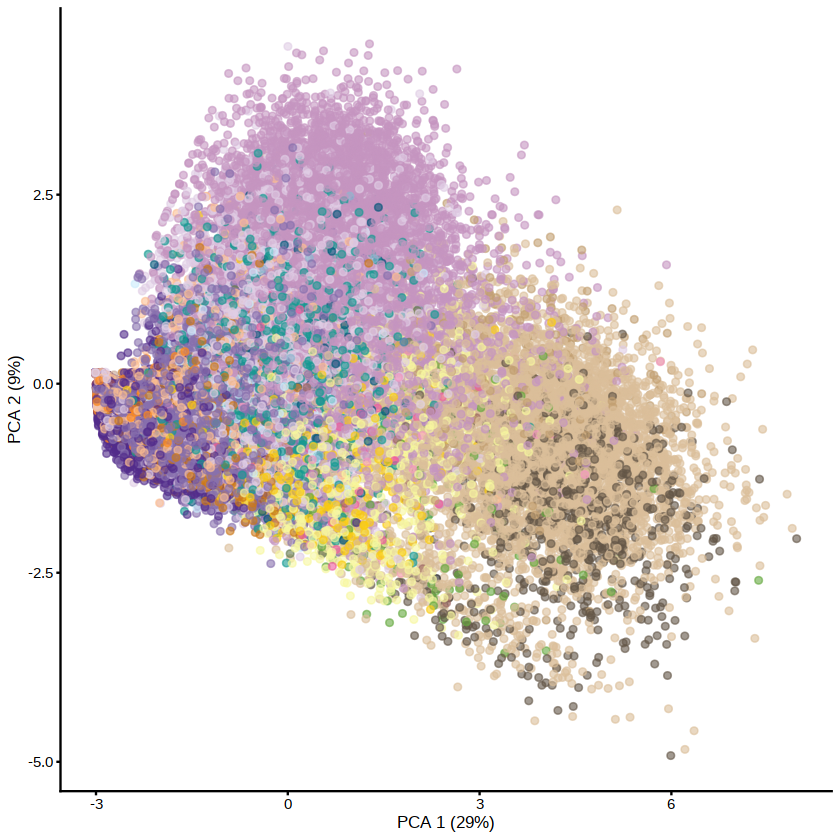

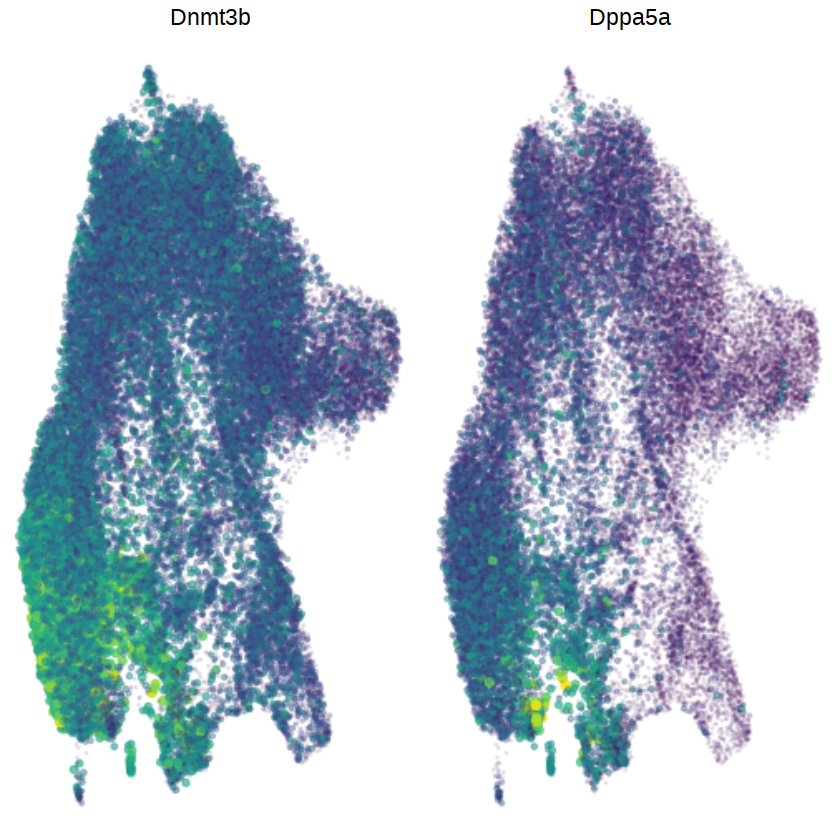

In [32]:

for (i in args$celltypes) {
  
  # PCA of marker genes
  genes.to.use <- unique(marker_genes.dt[celltype==i,gene])
  sce_tmp <- sce[genes.to.use,]
  sce_tmp <- scater::runPCA(sce_tmp, ncomponents = 2, ntop=nrow(sce_tmp))
    
  p <- plotPCA(sce_tmp, colour_by=args$celltype_label) + 
    scale_color_manual(values=opts$celltype.colors) +
    theme(
      legend.position = "none"
    )
  
#  pdf(file.path(args$outdir,sprintf("pca_%s_markers.pdf",i)))
  print(p)
#  dev.off()
  
  # Scatterplot of marker genes
  genes.to.plot <- unique(marker_genes.dt[celltype==i & score>=0.85,gene])
  if (length(genes.to.plot)>16) genes.to.plot <- genes.to.plot %>% sample(size=16)
  # genes.to.plot <- c("Hbb-y","Hba-x","Hba-a2","Hba-a1")
  
  p_list <- genes.to.plot %>% map(function(j) {
values = as.vector(logcounts(sce[j]))
minmax = (values- min(values)) /(max(values)-min(values))
ggplot(umap.df, aes(UMAP1, UMAP2, col=minmax, alpha = minmax)) + #, size = minmax
      ggrastr::rasterize(geom_point(size=minmax*2), dpi=300) + 
      viridis::scale_color_viridis() + 
      theme_void() +
      labs(title=j) +
      theme(
        plot.title = element_text(hjust = 0.5, size=rel(1.25)),
        legend.position = "none"
        )
    }
  )
  
  png(file.path(args$outdir,sprintf("umap_%s_markers.png",i)))
  print(cowplot::plot_grid(plotlist=p_list))
  dev.off()
  print(cowplot::plot_grid(plotlist=p_list)) 
}

In [22]:
  genes.to.use <- unique(marker_genes.dt[celltype=='Epiblast',gene])
  sce_tmp <- sce[genes.to.use,]

In [56]:
test = colMeans(logcounts(sce_tmp))

In [57]:
test2 = merge(test, colData(sce), by=0)

In [58]:
options(repr.plot.width=20, repr.plot.height=8)

Warning message:
“Groups with fewer than two data points have been dropped.”
Warning message:
“position_dodge requires non-overlapping x intervals”


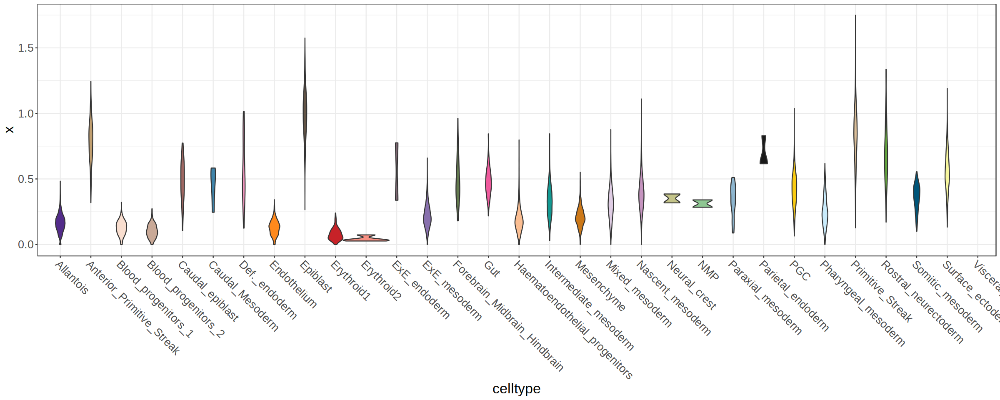

In [59]:
ggplot(test2, aes(celltype, x, fill=celltype)) + 
    geom_violin(width=1.5) + 
    scale_fill_manual(values=opts$celltype.colors) + 
    theme_bw() +
    theme(axis.text.x = element_text(angle=-45, hjust=0,vjust=1),
         text = element_text(size=20, color='black'),
            legend.position='none')

In [222]:
args$celltypes = unique(marker_genes.dt$celltype)

In [223]:
#args$celltypes = c('Epiblast', 'Allantois', 'Endothelium', 'Blood_progenitors_2')

In [229]:
marker_any = marker_genes.dt[score>0.85] %>% unique(by='gene')

# Determine cell type score per cell
score_celltypes = lapply(args$celltypes, function(i){
  # select marker genes for celltype  
  genes.to.use <- unique(marker_genes.dt[celltype==i & score>=0.85,gene])
  # Only keep top 20 genes
  if(length(genes.to.use)>30){genes.to.use = genes.to.use[1:30]}
  # subset sce
  sce_tmp <- sce[genes.to.use,]
  
  # Negative markers
  marker_neg = marker_genes.dt[celltype==i & score < 0.35 & gene %in% marker_any$gene, gene]  
  sce_tmp2 <- sce[marker_neg,] 
    
  # calculate celltypescore per cell
  tmp = data.table(cell = colnames(sce), 
                   celltype = colData(sce)$celltype, 
                   celltype_test = i, 
                   score = colMeans(t(scale(t(logcounts(sce_tmp))))),
                   score_neg = colMeans(t(scale(t(logcounts(sce_tmp2)))))) # score is mean of scaled logcounts
    return(tmp)
    }) %>% rbindlist(.) %>% .[,score_tot:=score-score_neg] %>% .[,zscore:=scale(score_tot), by=celltype]  %>% # then finally zscore by celltype again
        .[,zscore_capped:=ifelse(zscore<=-3, -3, ifelse(zscore>=3, 3, zscore))] # cap z-scores

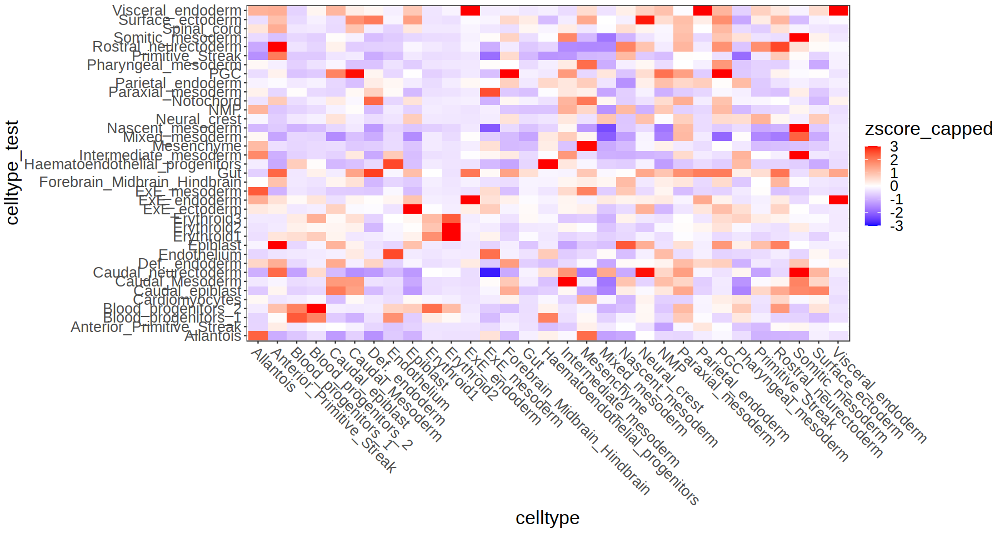

In [275]:
options(repr.plot.width=15, repr.plot.height=8)
ggplot(score_celltypes, aes(celltype, celltype_test, fill=zscore_capped)) + 
    scale_fill_gradient2(low='blue', mid='white', high='red') + 
    geom_tile() + 
    theme_bw() +
    theme(axis.text.x = element_text(angle=-45, hjust=0,vjust=1),
         text = element_text(size=20, color='black'),
            legend.position='right')

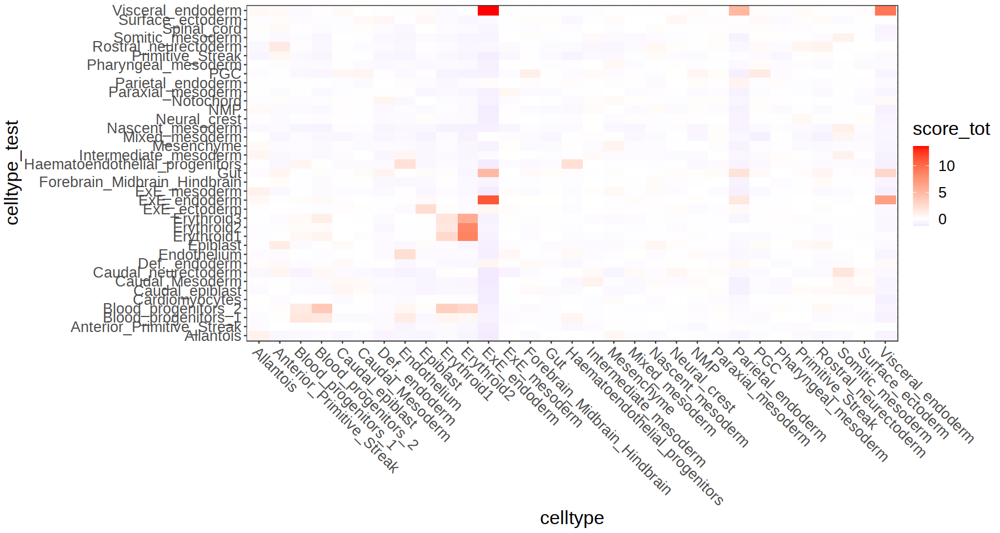

In [231]:
options(repr.plot.width=15, repr.plot.height=8)
ggplot(score_celltypes, aes(celltype, celltype_test, fill=score_tot)) + 
    scale_fill_gradient2(low='blue', mid='white', high='red') + 
    geom_tile() + 
    theme_bw() +
    theme(axis.text.x = element_text(angle=-45, hjust=0,vjust=1),
         text = element_text(size=20, color='black'),
            legend.position='right')

In [235]:
score_celltypes.plot = score_celltypes %>% dcast(cell ~ celltype_test, value.var='score_tot')# %>% matrix.please

In [236]:
umap.plot = merge(score_celltypes.plot, as.data.table(umap.df, keep.rownames=T), by.x='cell', by.y='rn')

In [272]:
  p_list <- args$celltypes %>% map(function(j) {
ggplot(umap.plot, aes_string('UMAP1', 'UMAP2', col=j, alpha=j, size=0.5)) + 
    ggrastr::rasterize(geom_point(), dpi=150) + 
    ggtitle(j) + 
    scale_color_gradient2(low='blue', mid='white', high='red') + 
    theme_void() + theme(legend.position='none', 
                        text=element_text(size=20)) 
      })

In [274]:
pdf(file.path(args$outdir,"umap_celltype_scores.pdf"), height=40, width = 40)
   print(cowplot::plot_grid(plotlist=p_list))
dev.off()

png 
  2

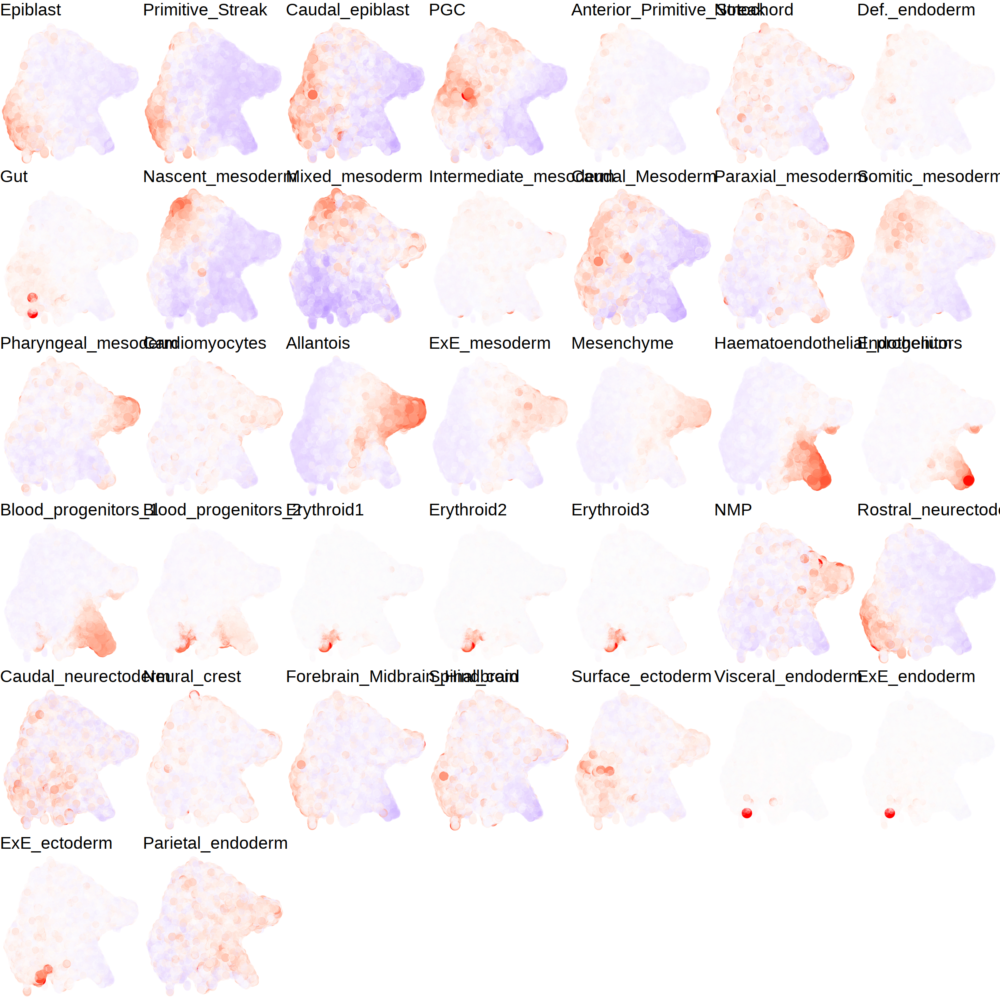

In [239]:
options(repr.plot.width=20, repr.plot.height=20)

print(cowplot::plot_grid(plotlist=p_list))


In [291]:
args$celltypes = 'Primitive_Streak'

In [302]:
marker_any = marker_genes.dt[score>0.85] %>% unique(by='gene')

# Determine cell type score per cell
score_celltypes = lapply(args$celltypes, function(i){
  # select marker genes for celltype  
  genes.to.use <- unique(marker_genes.dt[celltype==i & score>=0.85,gene])
  # Only keep top 20 genes
  if(length(genes.to.use)>30){genes.to.use = genes.to.use[1:30]}
  # subset sce
  sce_tmp <- sce[genes.to.use,]
  
  # Negative markers
  marker_neg = marker_genes.dt[celltype==i & score < 0.35 & gene %in% marker_any$gene, gene]  
  sce_tmp2 <- sce[marker_neg,] 
    
  # calculate celltypescore per cell
  tmp = data.table(cell = colnames(sce), 
                   celltype = colData(sce)$celltype, 
                   celltype_test = i, 
                   score = colMeans(t(scale(t(logcounts(sce_tmp))))),
                   score_neg = colMeans(t(scale(t(logcounts(sce_tmp2)))))) # score is mean of scaled logcounts
    return(tmp)
    }) %>% rbindlist(.) %>% .[,score_tot:=score-score_neg] %>% .[,zscore:=scale(score), by=celltype]  %>% # then finally zscore by celltype again
        .[,zscore_capped:=ifelse(zscore<=-3, -3, ifelse(zscore>=3, 3, zscore))] # cap z-scores

score_celltypes.plot = score_celltypes %>% dcast(cell ~ celltype_test, value.var='score_tot')# %>% matrix.please
umap.plot = merge(score_celltypes.plot, as.data.table(umap.df, keep.rownames=T), by.x='cell', by.y='rn')


  p_list <- args$celltypes %>% map(function(j) {
ggplot(umap.plot, aes_string('UMAP1', 'UMAP2', col=j, alpha=j, size=0.5)) + 
    ggrastr::rasterize(geom_point(), dpi=150) + 
    ggtitle(j) + 
    scale_color_gradient2(low='blue', mid='white', high='red') + 
    theme_void() + theme(legend.position='none', 
                        text=element_text(size=20)) 
      })

pdf(file.path(args$outdir,"umap_celltype_scores.pdf"), height=40, width = 40)
   print(cowplot::plot_grid(plotlist=p_list))
dev.off()

png 
  2

In [299]:
pdf(file.path(args$outdir,"umap_celltype_scores.pdf"), height=40, width = 40)
   print(cowplot::plot_grid(plotlist=p_list))
dev.off()

png 
  2

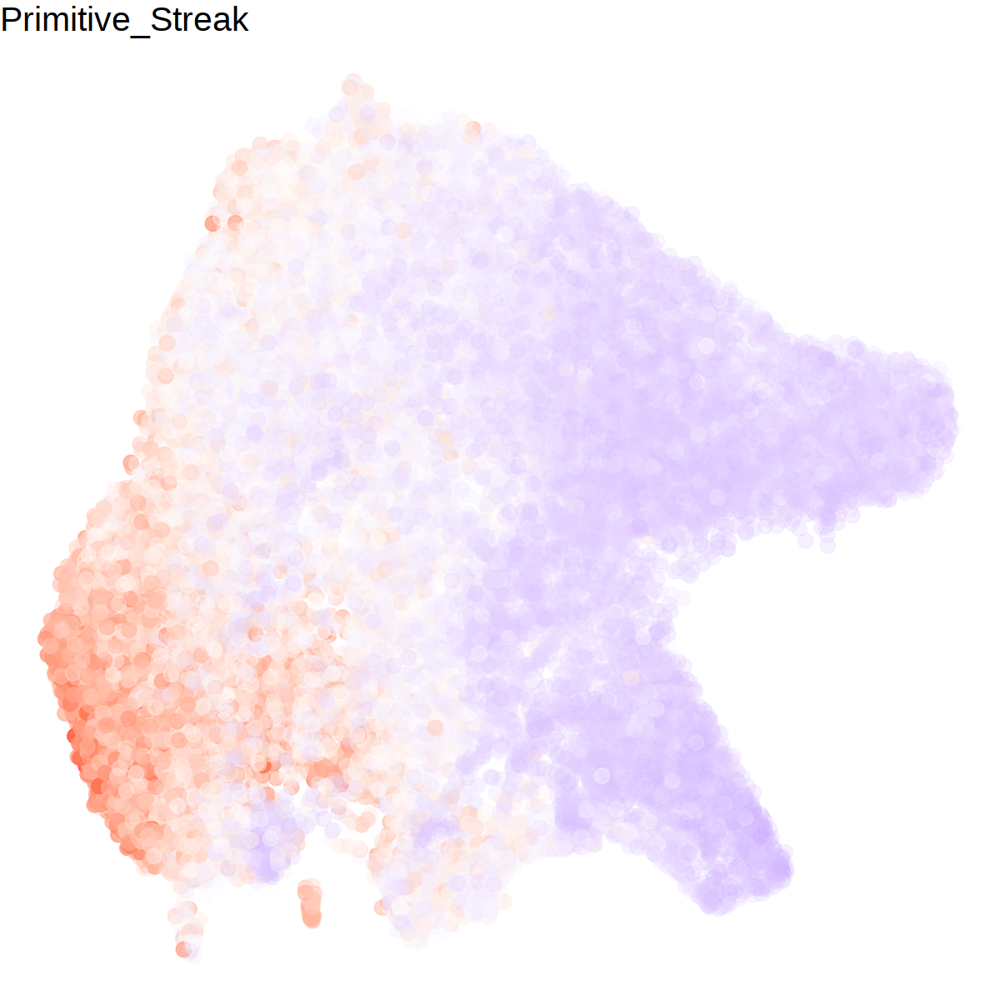

In [301]:
p_list[[1]]

In [ ]:
  pdf(file.path(args$outdir,sprintf("umap_%s_markers.pdf",i)))
  print(cowplot::plot_grid(plotlist=p_list))
  dev.off()

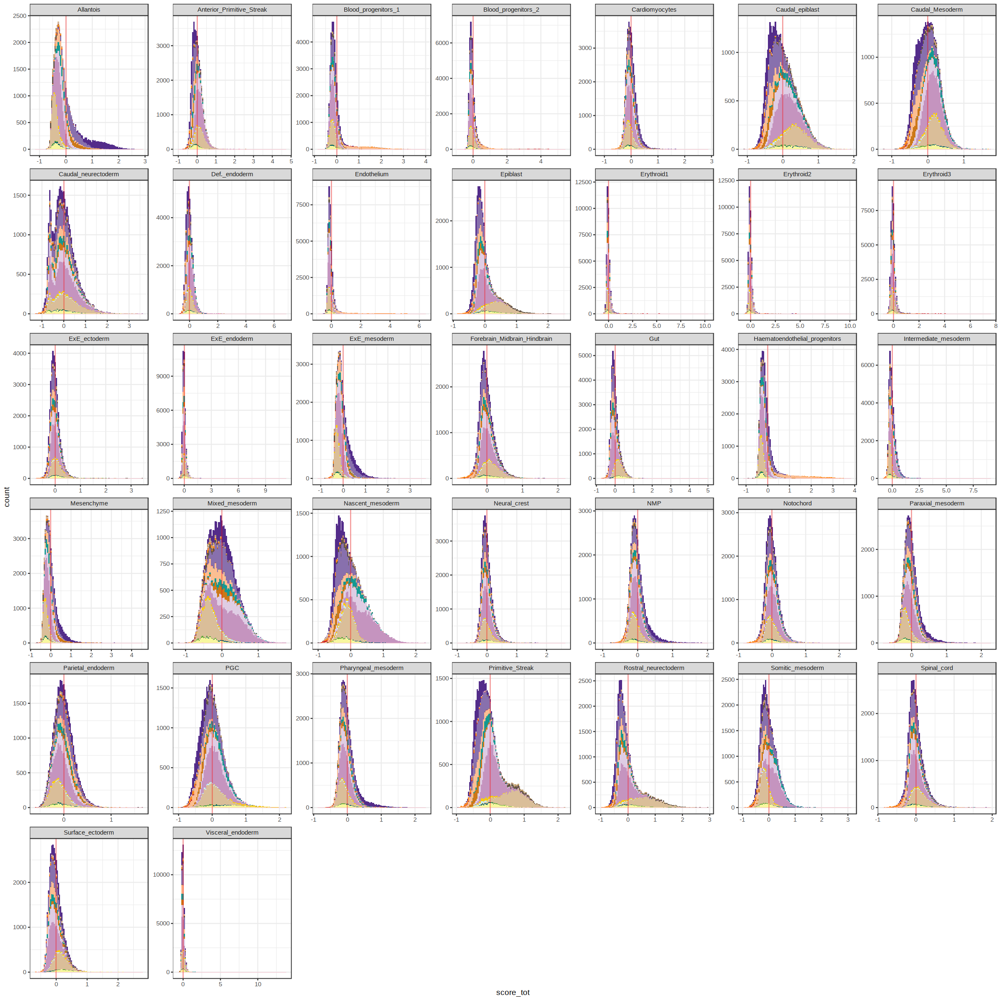

In [254]:
ggplot(score_celltypes, aes(score_tot, fill=celltype)) + 
    geom_histogram(bins = 100, size = 0.5) + 
    scale_fill_manual(values = opts$celltype.colors) + 
    facet_wrap(~celltype_test, scales='free') + 
    geom_vline(xintercept = 0, color='red', alpha = 0.4) + 
    theme_bw() + 
    theme(legend.position='none')

In [ ]:
test5 = test3 %>% dcast(celltype ~ celltype_test, value.var='zscored') %>% matrix.please

Aggregate function missing, defaulting to 'length'



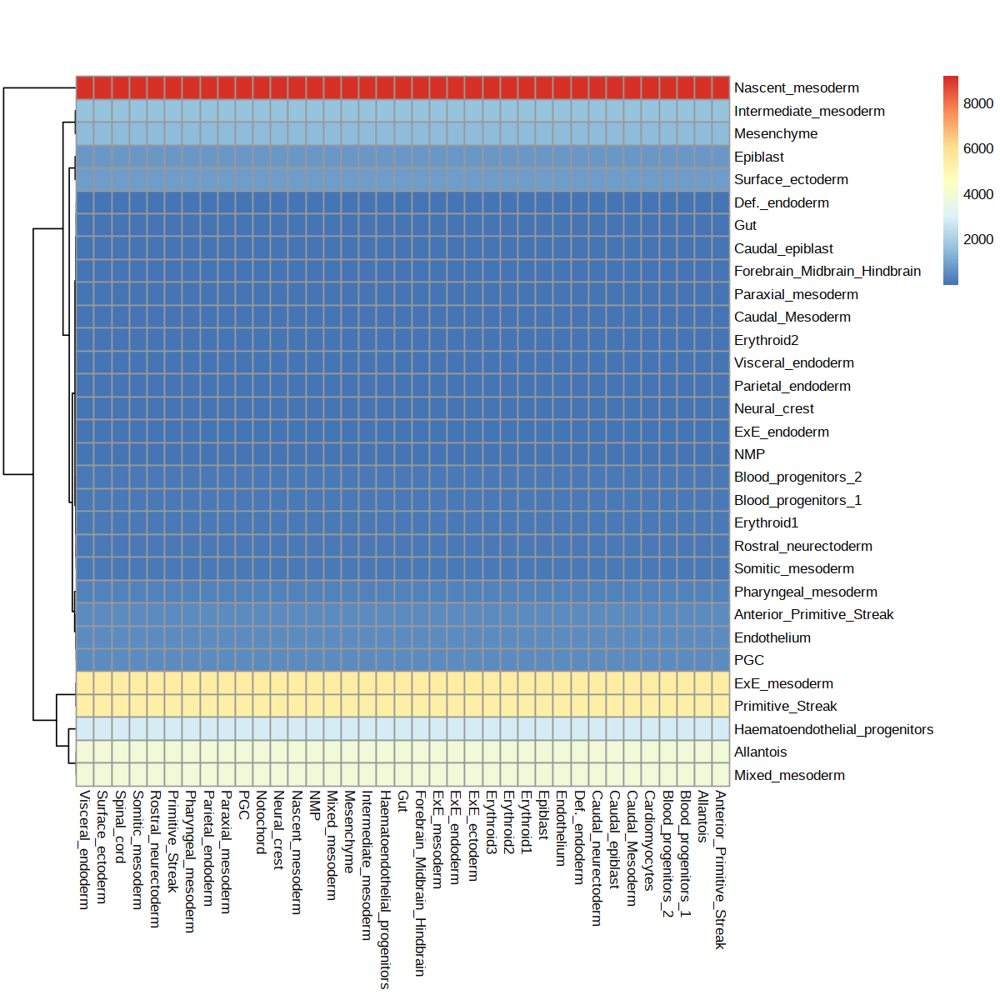

In [ ]:
options(repr.plot.width=10, repr.plot.height=10)
pheatmap::pheatmap(test5)

In [47]:
score_celltypes = score_celltypes %>% .[,zscore:=scale(score), by=celltype_test]  %>% 
    .[,zscore_celltype:=scale(score), by=celltype]

In [104]:
head(score_celltypes)

cell,celltype,celltype_test,score,zscore,zscore_capped
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>
1A_Eo_DEG_G9_day3#AAACAGCCAGCAAGAT-1,Epiblast,Allantois,-0.4093841,-1.0063094,-1.0063094
1A_Eo_DEG_G9_day3#AAACAGCCAGCACCAT-1,Primitive_Streak,Allantois,-0.4512122,-1.3309379,-1.3309379
1A_Eo_DEG_G9_day3#AAACATGCAAGTAAGC-1,Epiblast,Allantois,-0.4614606,-1.1421021,-1.1421021
1A_Eo_DEG_G9_day3#AAACATGCAATATACC-1,Primitive_Streak,Allantois,-0.5860464,-1.7621325,-1.7621325
1A_Eo_DEG_G9_day3#AAACATGCAATCCTGA-1,Epiblast,Allantois,-0.3498347,-0.8510308,-0.8510308
1A_Eo_DEG_G9_day3#AAACATGCACTTAGGC-1,Primitive_Streak,Allantois,-0.4601223,-1.3594320,-1.3594320


In [232]:
test6 = score_celltypes %>%  .[order(-score_tot),head(.SD, 1), by = "cell"]

In [233]:
umap.plot = merge(test6, as.data.table(umap.df, keep.rownames=T), by.x='cell', by.y='rn')

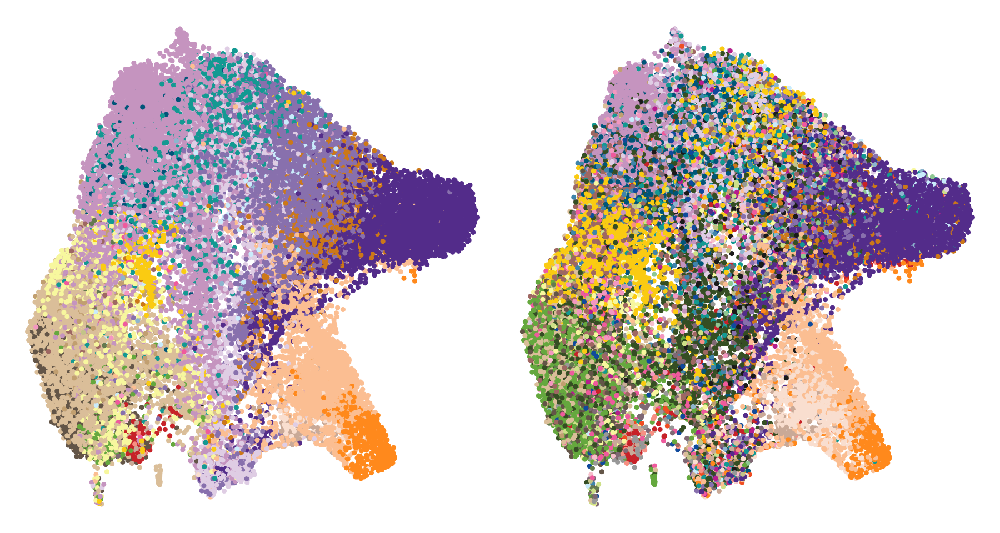

In [234]:
p1 = ggplot(umap.plot, aes(UMAP1, UMAP2, col=celltype)) + 
    geom_point() + 
    scale_color_manual(values=opts$celltype.colors) + 
    theme_void() + theme(legend.position='none')

p2 = ggplot(umap.plot, aes(UMAP1, UMAP2, col=celltype_test)) + 
    geom_point() + 
    scale_color_manual(values=opts$celltype.colors) + 
    theme_void() + theme(legend.position='none')

library(patchwork)
options(repr.plot.width=15, repr.plot.height=8)

p1+ p2

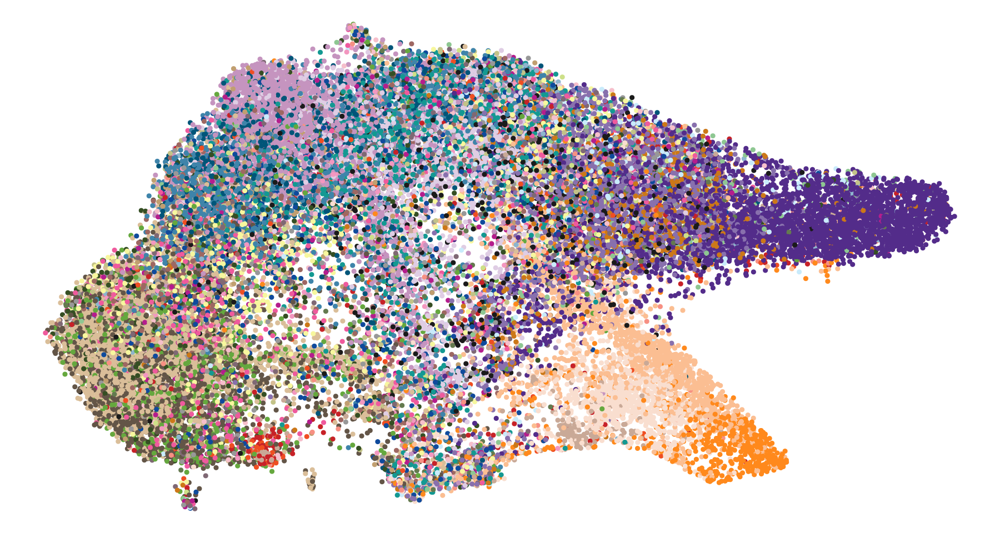

In [115]:
test6 = score_celltypes %>% .[celltype_test!='PGC', ] %>%.[order(-zscore),head(.SD, 1), by = "cell"]

umap.plot = merge(test6, as.data.table(umap.df, keep.rownames=T), by.x='cell', by.y='rn')

ggplot(umap.plot, aes(UMAP1, UMAP2, col=celltype_test)) + 
    geom_point() + 
    scale_color_manual(values=opts$celltype.colors) + 
    theme_void() + theme(legend.position='none')

In [199]:
test = lapply(args$celltypes, function(i){
  genes.to.use <- unique(marker_genes.dt[celltype==i,gene][1:10])
  sce_tmp <- sce[genes.to.use,]
  minmax_counts = apply(logcounts(sce_tmp), 2, function(x){(x- min(x)) /(max(x)-min(x))})
  tmp = data.table(cell = colnames(sce), celltype = colData(sce)$celltype, celltype_test = i, score = colMeans(minmax_counts))

    return(tmp)
    })

In [200]:
test2 = rbindlist(test) %>% .[,zscore:=scale(score), by=celltype]
#test2 = test2[,zscore:=ifelse(zscore<=-3, -3, ifelse(zscore>=3, 3, zscore))]

In [201]:
test3 = test2[,zscore_mean:=mean(zscore), by=c('celltype', 'celltype_test')] %>% unique(by=c('celltype', 'celltype_test'))

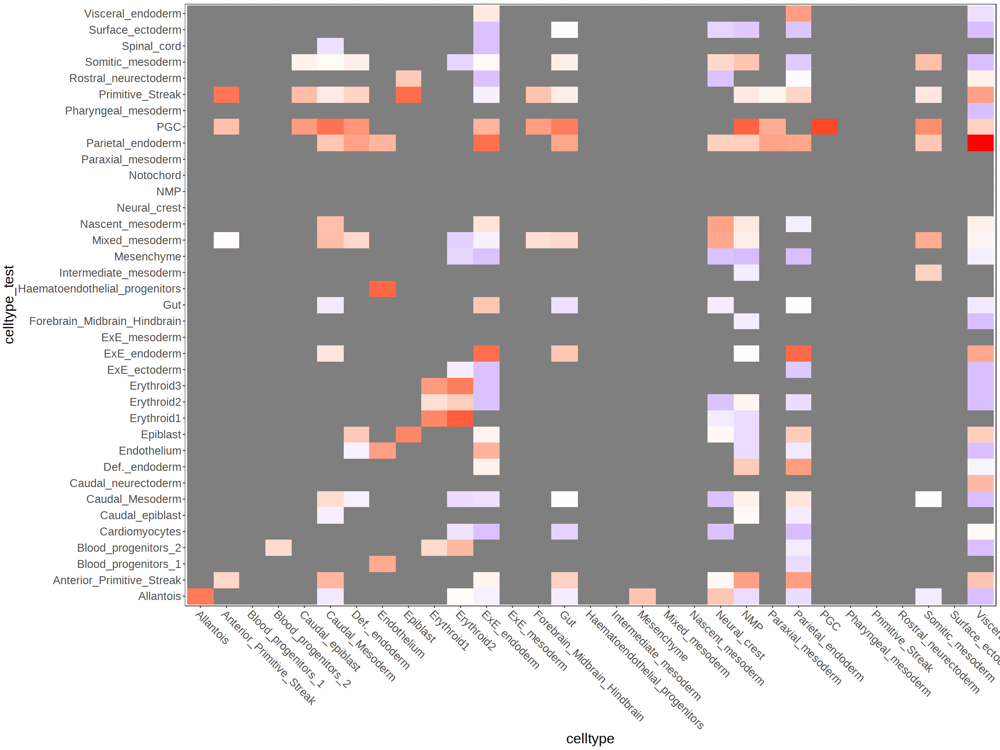

In [202]:
options(repr.plot.width=20, repr.plot.height=15)
ggplot(test3, aes(celltype, celltype_test, fill=zscore_mean)) + 
    scale_fill_gradient2(low='blue', mid='white', high='red') + 
    geom_tile() + 
    theme_bw() +
    theme(axis.text.x = element_text(angle=-45, hjust=0,vjust=1),
         text = element_text(size=20, color='black'),
            legend.position='none')

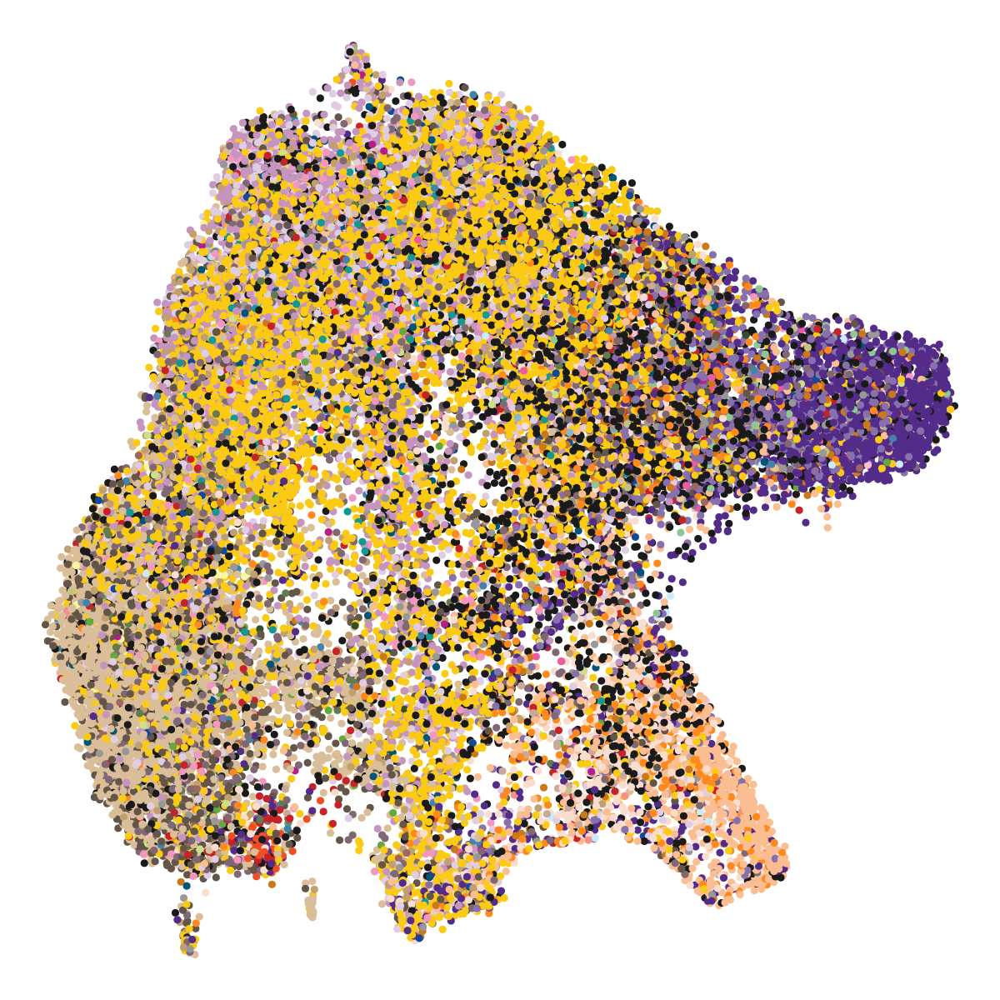

In [203]:
test6 = test2 %>%  .[order(-zscore),head(.SD, 1), by = "cell"]
umap.plot = merge(test6, as.data.table(umap.df, keep.rownames=T), by.x='cell', by.y='rn')
options(repr.plot.width=10, repr.plot.height=10)

ggplot(umap.plot, aes(UMAP1, UMAP2, col=celltype_test)) + 
    geom_point() + 
    scale_color_manual(values=opts$celltype.colors) + 
    theme_void() + theme(legend.position='none')

In [128]:
test = fread("/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/gastrulation/pijuansala2019_gastrulation10x/results/marker_genes/all_stages/avg_expr_per_celltype_and_gene.txt.gz")

In [129]:
head(test)

ens_id,mean_expr,detection_rate,group,gene
<chr>,<dbl>,<dbl>,<chr>,<chr>
ENSMUSG00000000001,1.125,0.727,Epiblast,Gnai3
ENSMUSG00000000001,1.193,0.771,Primitive Streak,Gnai3
ENSMUSG00000000001,1.033,0.743,ExE ectoderm,Gnai3
ENSMUSG00000000001,1.175,0.677,Visceral endoderm,Gnai3
ENSMUSG00000000001,0.931,0.632,ExE endoderm,Gnai3
ENSMUSG00000000001,1.205,0.778,Nascent mesoderm,Gnai3


In [130]:
test = fread("/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/gastrulation/pijuansala2019_gastrulation10x/results/marker_genes/all_stages/marker_genes.txt.gz")

In [132]:
tail(test)

celltype,gene,ens_id,score,N
<chr>,<chr>,<chr>,<dbl>,<int>
Visceral_endoderm,Adk,ENSMUSG00000039197,0.75,1
Visceral_endoderm,Zdhhc12,ENSMUSG00000015335,0.75,2
Visceral_endoderm,Plin3,ENSMUSG00000024197,0.75,2
Visceral_endoderm,Crip1,ENSMUSG00000006360,0.75,3
Visceral_endoderm,Kif21a,ENSMUSG00000022629,0.75,1
Visceral_endoderm,Klf9,ENSMUSG00000033863,0.75,2


In [133]:
head(fread("/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/gastrulation/pijuansala2019_gastrulation10x/results/pseudobulk/old/avg_expr_per_celltype_and_gene.txt.gz"))

ens_id,mean_expr,celltype,gene
<chr>,<dbl>,<chr>,<chr>
ENSMUSG00000000001,1.125,Epiblast,Gnai3
ENSMUSG00000000001,1.266,Caudal_epiblast,Gnai3
ENSMUSG00000000001,1.262,Rostral_neurectoderm,Gnai3
ENSMUSG00000000001,1.324,Forebrain_Midbrain_Hindbrain,Gnai3
ENSMUSG00000000001,1.237,Spinal_cord,Gnai3
ENSMUSG00000000001,1.212,Intermediate_mesoderm,Gnai3


In [141]:
head(fread("/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/gastrulation_multiome/results/rna/differential/cells/celltype/marker_genes/marker_genes_all.txt.gz"),20)

celltype,gene,score
<chr>,<chr>,<dbl>
Epiblast,Acsl4,1.00
Epiblast,Hs3st5,1.00
Epiblast,Dgki,0.97
Epiblast,Elavl3,0.97
Epiblast,Enpp3,0.97
Epiblast,Ftx,0.97
Epiblast,Gm2164,0.97
Epiblast,Kcnh8,0.97
Epiblast,Mcf2,0.97


In [142]:
head(marker_genes.dt[celltype=='Epiblast'], 20)

celltype,gene,ens_id,score,N
<chr>,<chr>,<chr>,<dbl>,<int>
Epiblast,Slc7a3,ENSMUSG00000031297,1.0000000,5
Epiblast,Utf1,ENSMUSG00000047751,0.9722222,4
Epiblast,Pou3f1,ENSMUSG00000090125,0.9722222,5
Epiblast,Zbtb8a,ENSMUSG00000028807,0.9722222,1
Epiblast,Dnmt3b,ENSMUSG00000027478,0.9444444,3
Epiblast,Pim2,ENSMUSG00000031155,0.9444444,4
Epiblast,Pdzd4,ENSMUSG00000002006,0.9444444,1
Epiblast,Gng3,ENSMUSG00000071658,0.9444444,3
Epiblast,Rbpms2,ENSMUSG00000032387,0.9166667,3
